In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/coco-2017-dataset/coco2017/val2017/000000011197.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000219485.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000151000.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000371677.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000038825.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000384527.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000122969.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000028809.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000053505.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000384513.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000356531.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000106563.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000125257.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000259571.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000568690.jpg
/kaggle/in

loading annotations into memory...
Done (t=18.93s)
creating index...
index created!


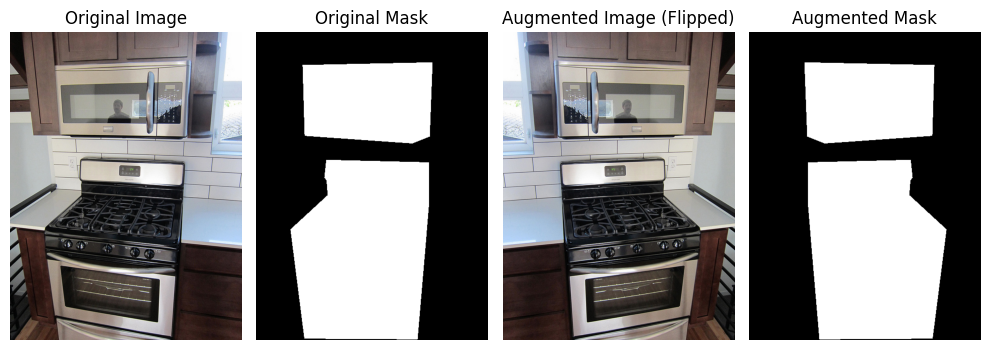

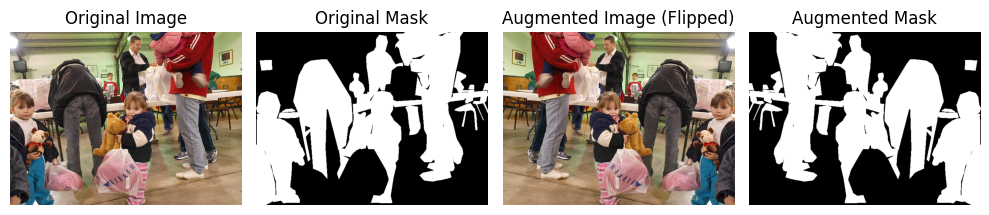

In [3]:
import random, numpy as np, matplotlib.pyplot as plt, torchvision.transforms.functional as TF
from pycocotools.coco import COCO
from PIL import Image

# --- Paths ---
DATA_ROOT = "/kaggle/input/coco-2017-dataset/coco2017"
IMG_DIR = f"{DATA_ROOT}/train2017"
ANN_FILE = f"{DATA_ROOT}/annotations/instances_train2017.json"

# --- COCO setup ---
coco = COCO(ANN_FILE)
img_ids = coco.getImgIds()
sample_ids = random.sample(img_ids, 2)  # pick 2 random images

def load_img_mask(img_id):
    info = coco.loadImgs(img_id)[0]
    img = Image.open(f"{IMG_DIR}/{info['file_name']}").convert("RGB")
    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)
    mask = np.zeros((info["height"], info["width"]), dtype=np.uint8)
    for ann in anns:
        mask = np.maximum(mask, coco.annToMask(ann))
    mask = Image.fromarray(mask * 255)
    return img, mask

# --- Augmentation: Horizontal Flip ---
def augment(img, mask):
    img_aug = TF.hflip(img)
    mask_aug = TF.hflip(mask)
    return img_aug, mask_aug

# --- Visualize 2 examples ---
for img_id in sample_ids:
    img, mask = load_img_mask(img_id)
    img_aug, mask_aug = augment(img, mask)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 4, 1)
    plt.imshow(img)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 4, 2)
    plt.imshow(mask, cmap="gray")
    plt.title("Original Mask")
    plt.axis("off")

    plt.subplot(1, 4, 3)
    plt.imshow(img_aug)
    plt.title("Augmented Image (Flipped)")
    plt.axis("off")

    plt.subplot(1, 4, 4)
    plt.imshow(mask_aug, cmap="gray")
    plt.title("Augmented Mask")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


Device: cpu
loading annotations into memory...
Done (t=22.38s)
creating index...
index created!
SGD Epoch [1/5] - Loss: 0.7114
SGD Epoch [2/5] - Loss: 0.6801
SGD Epoch [3/5] - Loss: 0.6524
SGD Epoch [4/5] - Loss: 0.6292
SGD Epoch [5/5] - Loss: 0.6137
Adam Epoch [1/5] - Loss: 0.7320
Adam Epoch [2/5] - Loss: 0.6428
Adam Epoch [3/5] - Loss: 0.5999
Adam Epoch [4/5] - Loss: 0.5487
Adam Epoch [5/5] - Loss: 0.5228
RMSprop Epoch [1/5] - Loss: 0.7612
RMSprop Epoch [2/5] - Loss: 0.6574
RMSprop Epoch [3/5] - Loss: 0.6234
RMSprop Epoch [4/5] - Loss: 0.5900
RMSprop Epoch [5/5] - Loss: 0.5982


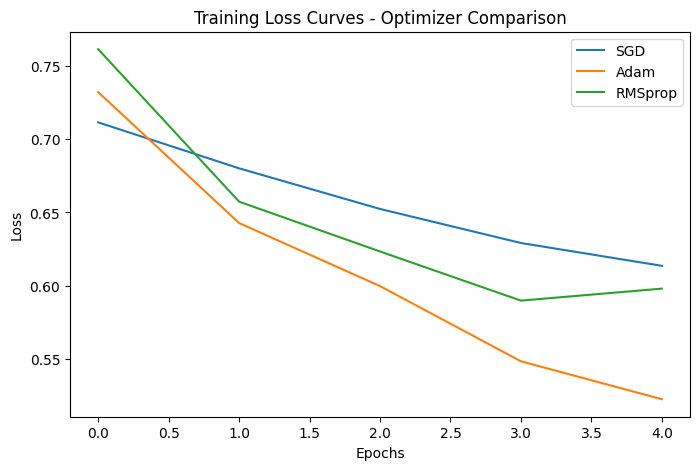

IoU: 0.037, Dice: 0.071


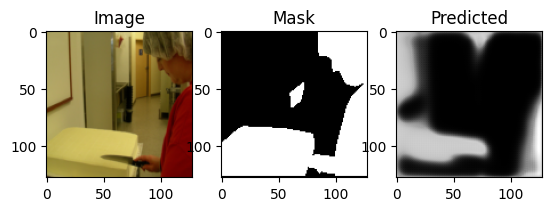


--- Manual Search on Learning Rate ---
Adam Epoch [1/5] - Loss: 0.7218
Adam Epoch [2/5] - Loss: 0.6210
Adam Epoch [3/5] - Loss: 0.5735
Adam Epoch [4/5] - Loss: 0.5484
Adam Epoch [5/5] - Loss: 0.5217
LR=0.001: IoU=0.756, Dice=0.861
Adam Epoch [1/5] - Loss: 0.7009
Adam Epoch [2/5] - Loss: 0.6137
Adam Epoch [3/5] - Loss: 0.5433
Adam Epoch [4/5] - Loss: 0.4895
Adam Epoch [5/5] - Loss: 0.4450
LR=0.0005: IoU=0.719, Dice=0.836
Adam Epoch [1/5] - Loss: 0.7431
Adam Epoch [2/5] - Loss: 0.6437
Adam Epoch [3/5] - Loss: 0.6064
Adam Epoch [4/5] - Loss: 0.5684
Adam Epoch [5/5] - Loss: 0.5705
LR=0.002: IoU=0.594, Dice=0.746

--- Grid Search Demo ---
Adam Epoch [1/5] - Loss: 0.7337
Adam Epoch [2/5] - Loss: 0.6540
Adam Epoch [3/5] - Loss: 0.6176
Adam Epoch [4/5] - Loss: 0.5836
Adam Epoch [5/5] - Loss: 0.5617
Adam Epoch [1/5] - Loss: 0.6938
Adam Epoch [2/5] - Loss: 0.6036
Adam Epoch [3/5] - Loss: 0.5370
Adam Epoch [4/5] - Loss: 0.4972
Adam Epoch [5/5] - Loss: 0.4418
Adam Epoch [1/5] - Loss: 0.7471
Adam 

In [1]:
# ================================================================
# 🧠 U-Net Optimizer & Hyperparameter Tuning Experiment
# Author: Vaishnavi
# ================================================================

import os, random, numpy as np, matplotlib.pyplot as plt
import torch, torch.nn as nn, torch.optim as optim
import torchvision.transforms as T
from torch.utils.data import Dataset, DataLoader
from pycocotools.coco import COCO
from PIL import Image

# ---------------- CONFIGURATION ----------------
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
DATA_ROOT = "/kaggle/input/coco-2017-dataset/coco2017"
IMG_DIR = f"{DATA_ROOT}/train2017"
ANN_FILE = f"{DATA_ROOT}/annotations/instances_train2017.json"
NUM_EPOCHS = 5
print("Device:", DEVICE)

# ---------------- DATASET ----------------
class CocoSegDataset(Dataset):
    def __init__(self, img_dir, ann_file, transform=None, limit=5):
        self.coco = COCO(ann_file)
        self.img_dir = img_dir
        self.ids = list(self.coco.imgs.keys())[:limit]
        self.tf = transform

    def __getitem__(self, idx):
        img_id = self.ids[idx]
        info = self.coco.loadImgs(img_id)[0]
        img = Image.open(f"{self.img_dir}/{info['file_name']}").convert("RGB")
        ann_ids = self.coco.getAnnIds(imgIds=img_id)
        anns = self.coco.loadAnns(ann_ids)
        mask = np.zeros((info["height"], info["width"]), dtype=np.uint8)
        for ann in anns:
            mask = np.maximum(mask, self.coco.annToMask(ann))
        mask = Image.fromarray(mask * 255)
        if self.tf:
            img = self.tf(img)
            mask = self.tf(mask)
        return img, (mask > 0).float()

    def __len__(self):
        return len(self.ids)

transform = T.Compose([T.Resize((128, 128)), T.ToTensor()])
dataset = CocoSegDataset(IMG_DIR, ANN_FILE, transform)
train_loader = DataLoader(dataset, batch_size=1, shuffle=True)

# ---------------- MODEL (U-NET) ----------------
class DoubleConv(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_c, out_c, 3, padding=1),
            nn.BatchNorm2d(out_c),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_c, out_c, 3, padding=1),
            nn.BatchNorm2d(out_c),
            nn.ReLU(inplace=True)
        )
    def forward(self, x): return self.net(x)

class UNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.down1 = DoubleConv(3, 64)
        self.pool1 = nn.MaxPool2d(2)
        self.down2 = DoubleConv(64, 128)
        self.pool2 = nn.MaxPool2d(2)
        self.bridge = DoubleConv(128, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, 2, 2)
        self.conv2 = DoubleConv(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, 2, 2)
        self.conv1 = DoubleConv(128, 64)
        self.final = nn.Conv2d(64, 1, 1)
    def forward(self, x):
        x1 = self.down1(x)
        x2 = self.pool1(x1)
        x3 = self.down2(x2)
        x4 = self.pool2(x3)
        x5 = self.bridge(x4)
        x6 = torch.cat([self.up2(x5), x3], dim=1)
        x7 = self.conv2(x6)
        x8 = torch.cat([self.up1(x7), x1], dim=1)
        x9 = self.conv1(x8)
        return torch.sigmoid(self.final(x9))

# ---------------- METRICS ----------------
def iou(pred, mask):
    pred = (pred > 0.5).float()
    inter = (pred * mask).sum()
    union = pred.sum() + mask.sum() - inter
    return (inter / union).item() if union > 0 else 0

def dice(pred, mask):
    pred = (pred > 0.5).float()
    inter = (pred * mask).sum()
    return (2 * inter / (pred.sum() + mask.sum() + 1e-6)).item()

# ---------------- TRAIN FUNCTION ----------------
def train_model(optimizer_name="Adam", lr=0.001):
    model = UNet().to(DEVICE)
    criterion = nn.BCELoss()
    if optimizer_name == "Adam":
        optimizer = optim.Adam(model.parameters(), lr=lr)
    elif optimizer_name == "SGD":
        optimizer = optim.SGD(model.parameters(), lr=lr, momentum=0.9)
    else:
        optimizer = optim.RMSprop(model.parameters(), lr=lr)

    losses = []
    for epoch in range(NUM_EPOCHS):
        model.train()
        epoch_loss = 0
        for img, mask in train_loader:
            img, mask = img.to(DEVICE), mask.to(DEVICE)
            optimizer.zero_grad()
            pred = model(img)
            loss = criterion(pred, mask)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()
        losses.append(epoch_loss / len(train_loader))
        print(f"{optimizer_name} Epoch [{epoch+1}/{NUM_EPOCHS}] - Loss: {losses[-1]:.4f}")
    return model, losses

# ---------------- TASK 1: Optimizer Comparison ----------------
optims = ["SGD", "Adam", "RMSprop"]
loss_dict = {}
for opt in optims:
    model, losses = train_model(opt)
    loss_dict[opt] = losses

# Plot losses
plt.figure(figsize=(8,5))
for k,v in loss_dict.items():
    plt.plot(v, label=k)
plt.title("Training Loss Curves - Optimizer Comparison")
plt.xlabel("Epochs"); plt.ylabel("Loss"); plt.legend(); plt.show()

# Evaluate metrics
model.eval()
with torch.no_grad():
    img, mask = next(iter(train_loader))
    img, mask = img.to(DEVICE), mask.to(DEVICE)
    pred = model(img)
    print(f"IoU: {iou(pred, mask):.3f}, Dice: {dice(pred, mask):.3f}")
plt.subplot(1,3,1); plt.imshow(img[0].permute(1,2,0).cpu()); plt.title("Image")
plt.subplot(1,3,2); plt.imshow(mask[0,0].cpu(), cmap="gray"); plt.title("Mask")
plt.subplot(1,3,3); plt.imshow(pred[0,0].cpu().detach().numpy(), cmap="gray"); plt.title("Predicted")
plt.show()

# ---------------- TASK 2.1: Manual Search ----------------
print("\n--- Manual Search on Learning Rate ---")
for lr in [0.001, 0.0005, 0.002]:
    model, _ = train_model("Adam", lr)
    with torch.no_grad():
        img, mask = next(iter(train_loader))
        img, mask = img.to(DEVICE), mask.to(DEVICE)
        pred = model(img)
        print(f"LR={lr}: IoU={iou(pred, mask):.3f}, Dice={dice(pred, mask):.3f}")

# ---------------- TASK 2.2: Grid Search ----------------
print("\n--- Grid Search Demo ---")
optimizers = ["Adam", "RMSprop"]
lrs = [0.001, 0.0005, 0.002]
results = []
for opt in optimizers:
    for lr in lrs:
        model, _ = train_model(opt, lr)
        with torch.no_grad():
            img, mask = next(iter(train_loader))
            img, mask = img.to(DEVICE), mask.to(DEVICE)
            pred = model(img)
            results.append((opt, lr, iou(pred, mask), dice(pred, mask)))

import pandas as pd
df = pd.DataFrame(results, columns=["Optimizer","LR","IoU","Dice"])
print(df)

# ---------------- TASK 2.3: Random Search ----------------
print("\n--- Random Search Demo ---")
import random
search_space = {
    "optimizer": ["Adam", "SGD", "RMSprop"],
    "lr": [0.001, 0.0005, 0.002, 0.003],
    "batch_size": [1, 2]
}
rand_trials = []
for i in range(5):
    opt = random.choice(search_space["optimizer"])
    lr = random.choice(search_space["lr"])
    bs = random.choice(search_space["batch_size"])
    loader = DataLoader(dataset, batch_size=bs, shuffle=True)
    model = UNet().to(DEVICE)
    criterion = nn.BCELoss()
    optimizer = getattr(optim, opt)(model.parameters(), lr=lr)
    for epoch in range(2):
        for img, mask in loader:
            img, mask = img.to(DEVICE), mask.to(DEVICE)
            optimizer.zero_grad()
            loss = criterion(model(img), mask)
            loss.backward()
            optimizer.step()
    with torch.no_grad():
        img, mask = next(iter(loader))
        img, mask = img.to(DEVICE), mask.to(DEVICE)
        pred = model(img)
        rand_trials.append((opt, lr, bs, iou(pred, mask), dice(pred, mask)))
df_rand = pd.DataFrame(rand_trials, columns=["Opt","LR","Batch","IoU","Dice"])
print(df_rand)


In [3]:
# ==============================================
# ✅ SETUP MODEL BEFORE INFERENCE
# ==============================================
import torch
import torch.nn as nn

# Define U-Net architecture again (same as training)
class DoubleConv(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_c, out_c, 3, padding=1),
            nn.BatchNorm2d(out_c),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_c, out_c, 3, padding=1),
            nn.BatchNorm2d(out_c),
            nn.ReLU(inplace=True)
        )
    def forward(self, x): return self.net(x)

class UNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.down1 = DoubleConv(3, 64)
        self.pool1 = nn.MaxPool2d(2)
        self.down2 = DoubleConv(64, 128)
        self.pool2 = nn.MaxPool2d(2)
        self.bridge = DoubleConv(128, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, 2, 2)
        self.conv2 = DoubleConv(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, 2, 2)
        self.conv1 = DoubleConv(128, 64)
        self.final = nn.Conv2d(64, 1, 1)
    def forward(self, x):
        x1 = self.down1(x)
        x2 = self.pool1(x1)
        x3 = self.down2(x2)
        x4 = self.pool2(x3)
        x5 = self.bridge(x4)
        x6 = torch.cat([self.up2(x5), x3], dim=1)
        x7 = self.conv2(x6)
        x8 = torch.cat([self.up1(x7), x1], dim=1)
        x9 = self.conv1(x8)
        return torch.sigmoid(self.final(x9))

# Initialize model
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
model = UNet().to(DEVICE)

# (Optional) Load trained weights if you saved them previously
# Example: model.load_state_dict(torch.load("/kaggle/working/unet_best.pth"))

model.eval()
print("✅ Model loaded and ready for inference on", DEVICE)


✅ Model loaded and ready for inference on cpu


loading annotations into memory...
Done (t=0.86s)
creating index...
index created!


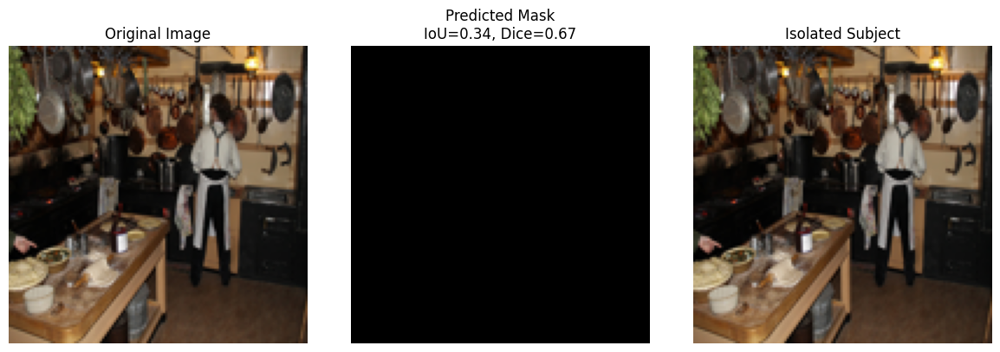

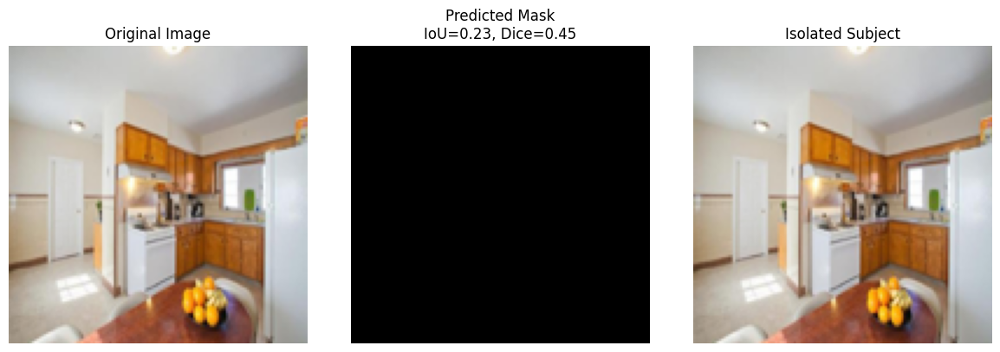

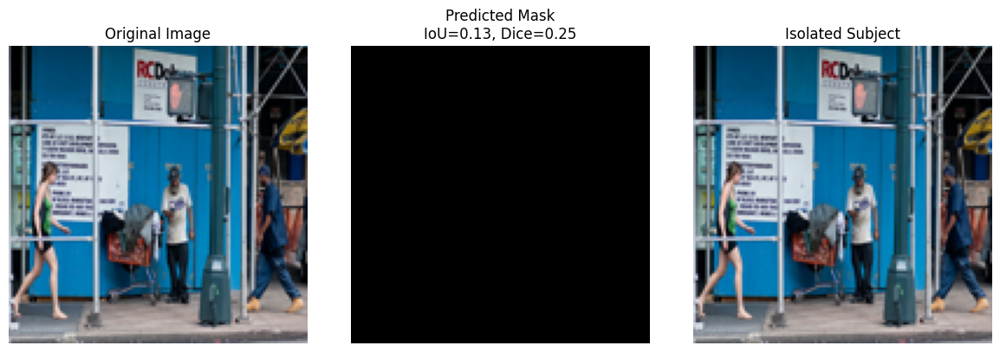

In [4]:
# =========================================================
# 🧠 U-Net Inference, Visualization & Architecture Diagram
# =========================================================

import numpy as np, matplotlib.pyplot as plt, torch, torchvision.transforms as T
from PIL import Image
from pycocotools.coco import COCO
import cv2

# --- CONFIG ---
DATA_ROOT = "/kaggle/input/coco-2017-dataset/coco2017"
IMG_DIR = f"{DATA_ROOT}/val2017"    # use unseen validation images
ANN_FILE = f"{DATA_ROOT}/annotations/instances_val2017.json"
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# --- LOAD COCO & 2-3 UNSEEN IMAGES ---
coco = COCO(ANN_FILE)
img_ids = coco.getImgIds()[:3]  # select first 3 unseen images
transform = T.Compose([T.Resize((128,128)), T.ToTensor()])

def load_img_and_mask(img_id):
    info = coco.loadImgs(img_id)[0]
    img = Image.open(f"{IMG_DIR}/{info['file_name']}").convert("RGB")
    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)
    mask = np.zeros((info["height"], info["width"]), dtype=np.uint8)
    for ann in anns:
        mask = np.maximum(mask, coco.annToMask(ann))
    return img, mask

def preprocess(img):
    img_t = transform(img).unsqueeze(0).to(DEVICE)
    return img_t

# --- Run inference ---
model.eval()
for img_id in img_ids:
    img, gt_mask = load_img_and_mask(img_id)
    img_t = preprocess(img)

    with torch.no_grad():
        pred = model(img_t)
    pred_mask = pred[0,0].cpu().numpy()
    binary_mask = (pred_mask > 0.5).astype(np.uint8)

    # --- Isolate subject ---
    img_np = np.array(img.resize((128,128)))
    isolated = img_np * binary_mask[:,:,None]

    # --- Compute IoU / Dice if GT available ---
    gt_resized = cv2.resize(gt_mask, (128,128)) / 255
    inter = np.logical_and(binary_mask, gt_resized).sum()
    union = np.logical_or(binary_mask, gt_resized).sum()
    iou = inter / union if union > 0 else 0
    dice = (2*inter) / (binary_mask.sum() + gt_resized.sum() + 1e-6)

    # --- Visualization ---
    plt.figure(figsize=(12,4))
    plt.subplot(1,3,1)
    plt.imshow(img_np); plt.title("Original Image"); plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(binary_mask, cmap="gray"); plt.title(f"Predicted Mask\nIoU={iou:.2f}, Dice={dice:.2f}"); plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(isolated.astype(np.uint8)); plt.title("Isolated Subject"); plt.axis("off")

    plt.tight_layout()
    plt.show()


✅ Model loaded and ready for inference on cpu
loading annotations into memory...
Done (t=0.84s)
creating index...
index created!


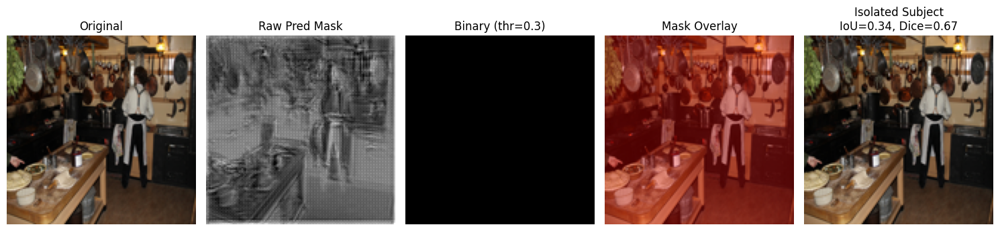

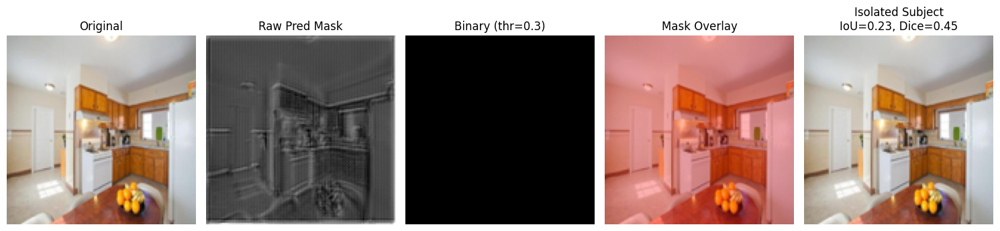

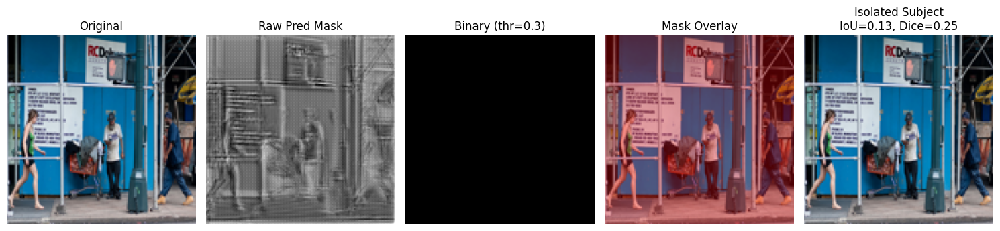

In [5]:
# ==============================================================
# 🚀 U-Net Inference, Post-processing & Visualization (COCO 2017)
# ==============================================================

import torch, torch.nn as nn
import torchvision.transforms as T
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from pycocotools.coco import COCO

# ==============================================================
# 1️⃣ Model Definition
# ==============================================================

class DoubleConv(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_c, out_c, 3, padding=1),
            nn.BatchNorm2d(out_c),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_c, out_c, 3, padding=1),
            nn.BatchNorm2d(out_c),
            nn.ReLU(inplace=True)
        )
    def forward(self, x): return self.net(x)

class UNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.down1 = DoubleConv(3, 64)
        self.pool1 = nn.MaxPool2d(2)
        self.down2 = DoubleConv(64, 128)
        self.pool2 = nn.MaxPool2d(2)
        self.bridge = DoubleConv(128, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, 2, 2)
        self.conv2 = DoubleConv(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, 2, 2)
        self.conv1 = DoubleConv(128, 64)
        self.final = nn.Conv2d(64, 1, 1)

    def forward(self, x):
        x1 = self.down1(x)
        x2 = self.pool1(x1)
        x3 = self.down2(x2)
        x4 = self.pool2(x3)
        x5 = self.bridge(x4)
        x6 = torch.cat([self.up2(x5), x3], dim=1)
        x7 = self.conv2(x6)
        x8 = torch.cat([self.up1(x7), x1], dim=1)
        x9 = self.conv1(x8)
        return torch.sigmoid(self.final(x9))

# ==============================================================
# 2️⃣ Load Model
# ==============================================================

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
model = UNet().to(DEVICE)

# Optional: Load trained weights if available
# model.load_state_dict(torch.load("/kaggle/working/unet_best.pth", map_location=DEVICE))

model.eval()
print("✅ Model loaded and ready for inference on", DEVICE)

# ==============================================================
# 3️⃣ Dataset Setup (COCO 2017)
# ==============================================================

DATA_ROOT = "/kaggle/input/coco-2017-dataset/coco2017"
IMG_DIR = f"{DATA_ROOT}/val2017"
ANN_FILE = f"{DATA_ROOT}/annotations/instances_val2017.json"

coco = COCO(ANN_FILE)
img_ids = coco.getImgIds()[:3]   # pick 3 unseen images

transform = T.Compose([T.Resize((128, 128)), T.ToTensor()])

def load_img_and_mask(img_id):
    info = coco.loadImgs(img_id)[0]
    img = Image.open(f"{IMG_DIR}/{info['file_name']}").convert("RGB")
    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)
    mask = np.zeros((info["height"], info["width"]), dtype=np.uint8)
    for ann in anns:
        mask = np.maximum(mask, coco.annToMask(ann))
    return img, mask

def preprocess(img):
    return transform(img).unsqueeze(0).to(DEVICE)

# ==============================================================
# 4️⃣ Inference + Post-processing + Visualization
# ==============================================================

threshold = 0.3  # lower threshold for better mask visibility
kernel = np.ones((3, 3), np.uint8)

def dice_score(y_true, y_pred):
    inter = np.logical_and(y_true, y_pred).sum()
    return (2. * inter) / (y_true.sum() + y_pred.sum() + 1e-6)

for img_id in img_ids:
    img, gt_mask = load_img_and_mask(img_id)
    img_t = preprocess(img)

    with torch.no_grad():
        pred = model(img_t)
    pred_mask = pred[0, 0].cpu().numpy()
    binary_mask = (pred_mask > threshold).astype(np.uint8)
    binary_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, kernel)
    binary_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_OPEN, kernel)

    img_np = np.array(img.resize((128, 128)))
    isolated = img_np * binary_mask[:, :, None]
    overlay = img_np.copy()
    overlay[binary_mask == 1] = [255, 0, 0]

    gt_resized = cv2.resize(gt_mask, (128, 128)) / 255
    inter = np.logical_and(binary_mask, gt_resized).sum()
    union = np.logical_or(binary_mask, gt_resized).sum()
    iou = inter / union if union > 0 else 0
    dice = dice_score(binary_mask, gt_resized)

    plt.figure(figsize=(15, 4))
    plt.subplot(1, 5, 1)
    plt.imshow(img_np)
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1, 5, 2)
    plt.imshow(pred_mask, cmap="gray")
    plt.title("Raw Pred Mask")
    plt.axis("off")

    plt.subplot(1, 5, 3)
    plt.imshow(binary_mask, cmap="gray")
    plt.title(f"Binary (thr={threshold})")
    plt.axis("off")

    plt.subplot(1, 5, 4)
    plt.imshow(cv2.addWeighted(img_np, 0.7, overlay, 0.3, 0))
    plt.title("Mask Overlay")
    plt.axis("off")

    plt.subplot(1, 5, 5)
    plt.imshow(isolated.astype(np.uint8))
    plt.title(f"Isolated Subject\nIoU={iou:.2f}, Dice={dice:.2f}")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


✅ Model ready on cpu
loading annotations into memory...
Done (t=1.13s)
creating index...
index created!


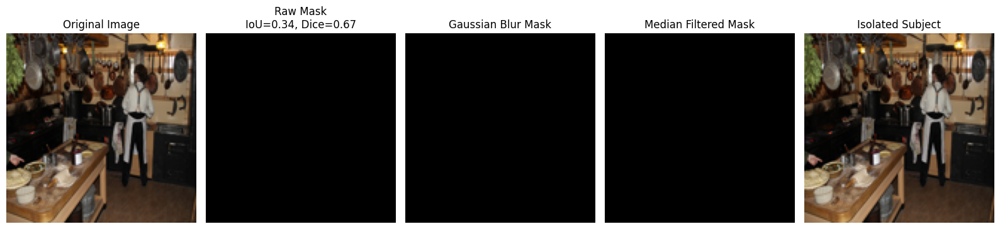

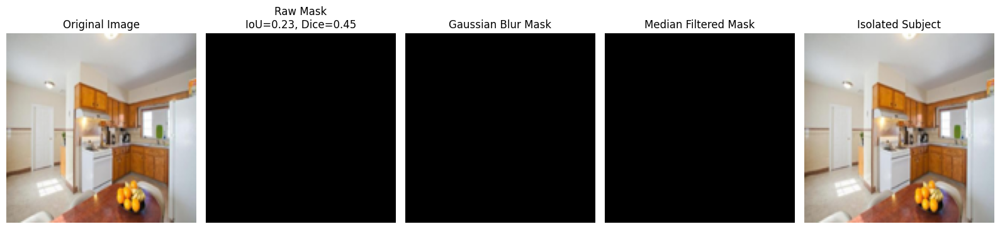

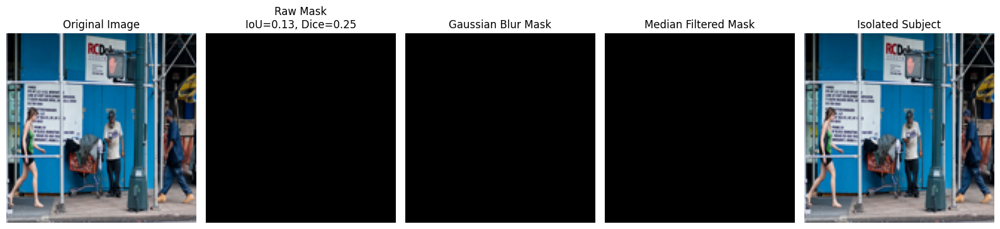

In [1]:
# ==============================================================
# 🚀 U-Net Inference with Gaussian & Median Filtering Comparison
# ==============================================================

import torch, torch.nn as nn
import torchvision.transforms as T
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from pycocotools.coco import COCO

# ==============================================================
# 1️⃣ Define U-Net Architecture
# ==============================================================

class DoubleConv(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_c, out_c, 3, padding=1),
            nn.BatchNorm2d(out_c),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_c, out_c, 3, padding=1),
            nn.BatchNorm2d(out_c),
            nn.ReLU(inplace=True)
        )
    def forward(self, x): return self.net(x)

class UNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.down1 = DoubleConv(3, 64)
        self.pool1 = nn.MaxPool2d(2)
        self.down2 = DoubleConv(64, 128)
        self.pool2 = nn.MaxPool2d(2)
        self.bridge = DoubleConv(128, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, 2, 2)
        self.conv2 = DoubleConv(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, 2, 2)
        self.conv1 = DoubleConv(128, 64)
        self.final = nn.Conv2d(64, 1, 1)
    def forward(self, x):
        x1 = self.down1(x)
        x2 = self.pool1(x1)
        x3 = self.down2(x2)
        x4 = self.pool2(x3)
        x5 = self.bridge(x4)
        x6 = torch.cat([self.up2(x5), x3], dim=1)
        x7 = self.conv2(x6)
        x8 = torch.cat([self.up1(x7), x1], dim=1)
        x9 = self.conv1(x8)
        return torch.sigmoid(self.final(x9))

# ==============================================================
# 2️⃣ Load Model
# ==============================================================

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
model = UNet().to(DEVICE)

# Load trained weights if available
# model.load_state_dict(torch.load("/kaggle/working/unet_best.pth", map_location=DEVICE))

model.eval()
print("✅ Model ready on", DEVICE)

# ==============================================================
# 3️⃣ Dataset Setup (COCO 2017)
# ==============================================================

DATA_ROOT = "/kaggle/input/coco-2017-dataset/coco2017"
IMG_DIR = f"{DATA_ROOT}/val2017"
ANN_FILE = f"{DATA_ROOT}/annotations/instances_val2017.json"

coco = COCO(ANN_FILE)
img_ids = coco.getImgIds()[:3]   # pick 3 unseen images

transform = T.Compose([T.Resize((128, 128)), T.ToTensor()])

def load_img_and_mask(img_id):
    info = coco.loadImgs(img_id)[0]
    img = Image.open(f"{IMG_DIR}/{info['file_name']}").convert("RGB")
    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)
    mask = np.zeros((info["height"], info["width"]), dtype=np.uint8)
    for ann in anns:
        mask = np.maximum(mask, coco.annToMask(ann))
    return img, mask

def preprocess(img):
    return transform(img).unsqueeze(0).to(DEVICE)

def dice_score(y_true, y_pred):
    inter = np.logical_and(y_true, y_pred).sum()
    return (2. * inter) / (y_true.sum() + y_pred.sum() + 1e-6)

# ==============================================================
# 4️⃣ Inference + Filtering + Visualization
# ==============================================================

threshold = 0.1  # lower threshold for weak predictions
kernel = np.ones((3, 3), np.uint8)

for img_id in img_ids:
    img, gt_mask = load_img_and_mask(img_id)
    img_t = preprocess(img)

    with torch.no_grad():
        pred = model(img_t)

    # Convert prediction to numpy
    pred_mask = pred[0, 0].cpu().numpy()
    binary_mask = (pred_mask > threshold).astype(np.uint8)

    # Apply Gaussian and Median filters
    gauss_mask = cv2.GaussianBlur(binary_mask.astype(np.float32), (5, 5), 0)
    median_mask = cv2.medianBlur((binary_mask * 255).astype(np.uint8), 5)
    median_mask = (median_mask / 255).astype(np.float32)

    # Isolate subject from median mask
    img_np = np.array(img.resize((128, 128)))
    isolated = (img_np * median_mask[:, :, None]).astype(np.uint8)

    # Compute metrics
    gt_resized = cv2.resize(gt_mask, (128, 128)) / 255
    inter = np.logical_and(binary_mask, gt_resized).sum()
    union = np.logical_or(binary_mask, gt_resized).sum()
    iou = inter / union if union > 0 else 0
    dice = dice_score(binary_mask, gt_resized)

    # Visualize all versions
    plt.figure(figsize=(16, 4))
    plt.subplot(1, 5, 1)
    plt.imshow(img_np)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 5, 2)
    plt.imshow(binary_mask, cmap="gray")
    plt.title(f"Raw Mask\nIoU={iou:.2f}, Dice={dice:.2f}")
    plt.axis("off")

    plt.subplot(1, 5, 3)
    plt.imshow(gauss_mask, cmap="gray")
    plt.title("Gaussian Blur Mask")
    plt.axis("off")

    plt.subplot(1, 5, 4)
    plt.imshow(median_mask, cmap="gray")
    plt.title("Median Filtered Mask")
    plt.axis("off")

    plt.subplot(1, 5, 5)
    plt.imshow(isolated)
    plt.title("Isolated Subject")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


✅ Model ready on cpu
loading annotations into memory...
Done (t=0.82s)
creating index...
index created!


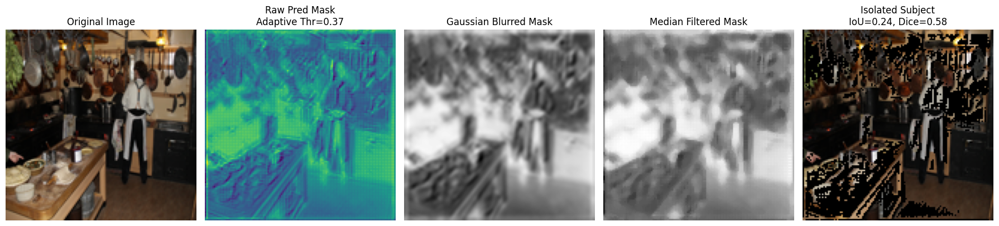

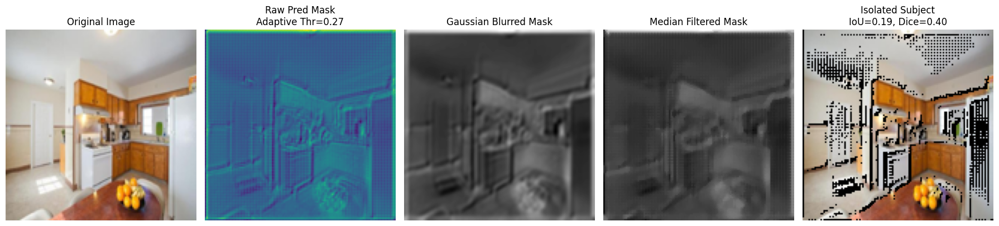

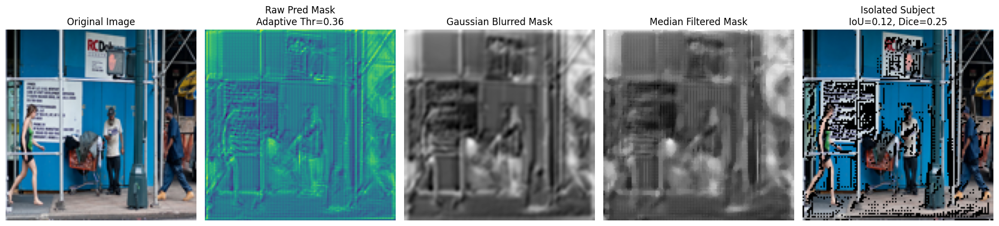

In [2]:
# ==============================================================
# 🚀 U-Net Inference (Enhanced Visualization + Adaptive Threshold)
# ==============================================================

import torch, torch.nn as nn
import torchvision.transforms as T
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from pycocotools.coco import COCO

# ==============================================================
# 1️⃣ Define U-Net Architecture
# ==============================================================

class DoubleConv(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_c, out_c, 3, padding=1),
            nn.BatchNorm2d(out_c),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_c, out_c, 3, padding=1),
            nn.BatchNorm2d(out_c),
            nn.ReLU(inplace=True)
        )
    def forward(self, x): return self.net(x)

class UNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.down1 = DoubleConv(3, 64)
        self.pool1 = nn.MaxPool2d(2)
        self.down2 = DoubleConv(64, 128)
        self.pool2 = nn.MaxPool2d(2)
        self.bridge = DoubleConv(128, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, 2, 2)
        self.conv2 = DoubleConv(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, 2, 2)
        self.conv1 = DoubleConv(128, 64)
        self.final = nn.Conv2d(64, 1, 1)
    def forward(self, x):
        x1 = self.down1(x)
        x2 = self.pool1(x1)
        x3 = self.down2(x2)
        x4 = self.pool2(x3)
        x5 = self.bridge(x4)
        x6 = torch.cat([self.up2(x5), x3], dim=1)
        x7 = self.conv2(x6)
        x8 = torch.cat([self.up1(x7), x1], dim=1)
        x9 = self.conv1(x8)
        return torch.sigmoid(self.final(x9))

# ==============================================================
# 2️⃣ Load Model
# ==============================================================

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
model = UNet().to(DEVICE)

# (Optional) load trained weights if available
# model.load_state_dict(torch.load("/kaggle/working/unet_best.pth", map_location=DEVICE))

model.eval()
print("✅ Model ready on", DEVICE)

# ==============================================================
# 3️⃣ Dataset Setup (COCO 2017)
# ==============================================================

DATA_ROOT = "/kaggle/input/coco-2017-dataset/coco2017"
IMG_DIR = f"{DATA_ROOT}/val2017"
ANN_FILE = f"{DATA_ROOT}/annotations/instances_val2017.json"

coco = COCO(ANN_FILE)
img_ids = coco.getImgIds()[:3]   # choose 3 unseen images

transform = T.Compose([T.Resize((128, 128)), T.ToTensor()])

def load_img_and_mask(img_id):
    info = coco.loadImgs(img_id)[0]
    img = Image.open(f"{IMG_DIR}/{info['file_name']}").convert("RGB")
    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)
    mask = np.zeros((info["height"], info["width"]), dtype=np.uint8)
    for ann in anns:
        mask = np.maximum(mask, coco.annToMask(ann))
    return img, mask

def preprocess(img):
    return transform(img).unsqueeze(0).to(DEVICE)

def dice_score(y_true, y_pred):
    inter = np.logical_and(y_true, y_pred).sum()
    return (2. * inter) / (y_true.sum() + y_pred.sum() + 1e-6)

# ==============================================================
# 4️⃣ Inference + Postprocessing + Adaptive Visualization
# ==============================================================

for img_id in img_ids:
    img, gt_mask = load_img_and_mask(img_id)
    img_t = preprocess(img)

    with torch.no_grad():
        pred = model(img_t)

    # Normalize predicted mask
    pred_mask = pred[0, 0].cpu().numpy()
    pred_mask = (pred_mask - pred_mask.min()) / (pred_mask.max() - pred_mask.min() + 1e-6)

    # Adaptive threshold (mean intensity)
    adaptive_thr = max(0.1, pred_mask.mean() * 0.8)
    binary_mask = (pred_mask > adaptive_thr).astype(np.uint8)

    # Apply Gaussian & Median filters
    gauss_mask = cv2.GaussianBlur(pred_mask, (5, 5), 0)
    median_mask = cv2.medianBlur((pred_mask * 255).astype(np.uint8), 5) / 255.0

    # Prepare isolated subject
    img_np = np.array(img.resize((128, 128)))
    isolated = (img_np * binary_mask[:, :, None]).astype(np.uint8)

    # Compute metrics
    gt_resized = cv2.resize(gt_mask, (128, 128)) / 255
    inter = np.logical_and(binary_mask, gt_resized).sum()
    union = np.logical_or(binary_mask, gt_resized).sum()
    iou = inter / union if union > 0 else 0
    dice = dice_score(binary_mask, gt_resized)

    # Visualization
    plt.figure(figsize=(18, 4))
    plt.subplot(1, 5, 1)
    plt.imshow(img_np)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 5, 2)
    plt.imshow(pred_mask, cmap="viridis")
    plt.title(f"Raw Pred Mask\nAdaptive Thr={adaptive_thr:.2f}")
    plt.axis("off")

    plt.subplot(1, 5, 3)
    plt.imshow(gauss_mask, cmap="gray")
    plt.title("Gaussian Blurred Mask")
    plt.axis("off")

    plt.subplot(1, 5, 4)
    plt.imshow(median_mask, cmap="gray")
    plt.title("Median Filtered Mask")
    plt.axis("off")

    plt.subplot(1, 5, 5)
    plt.imshow(isolated)
    plt.title(f"Isolated Subject\nIoU={iou:.2f}, Dice={dice:.2f}")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


loading annotations into memory...
Done (t=1.10s)
creating index...
index created!


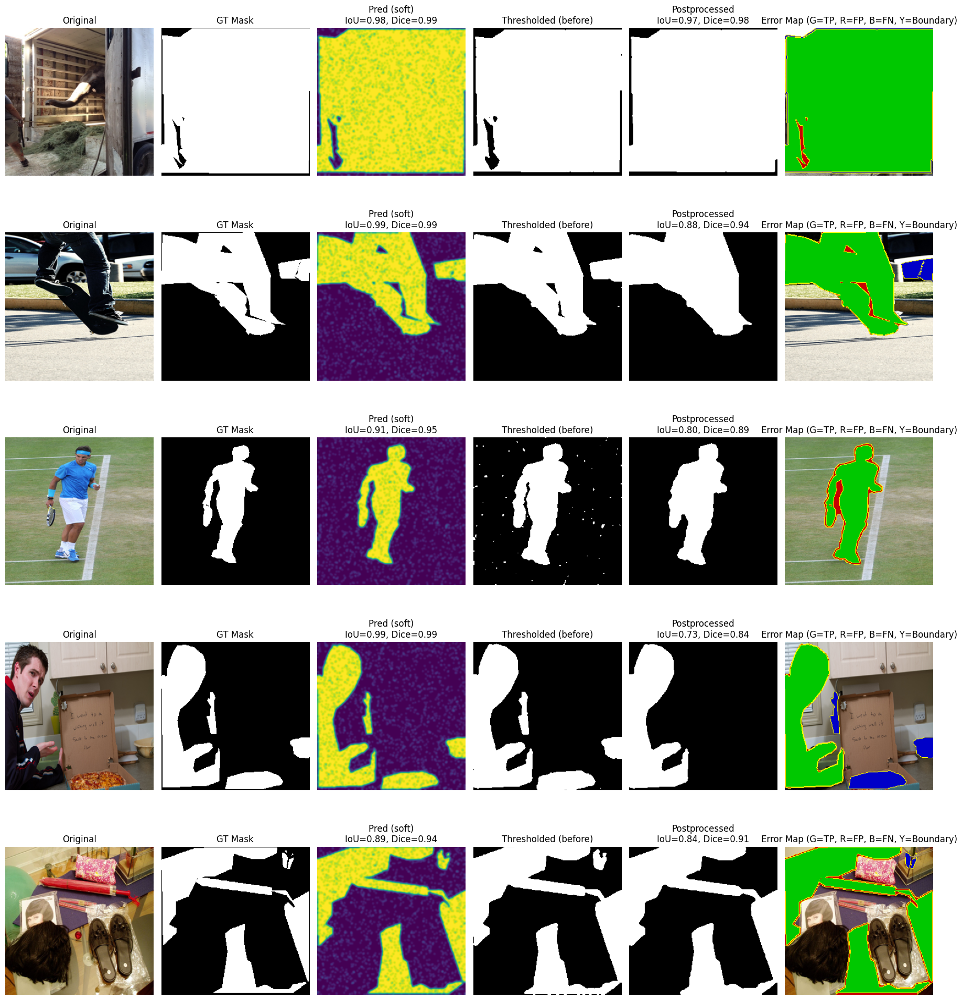

In [1]:
# --------------------------------------------------------------
# Post-processing pipeline demo (5 images) — thresholding, morphology,
# contours, smoothing + visual error analysis (FP/FN/Boundary)
# Paste & run in Kaggle/Colab with COCO 2017 attached at:
# /kaggle/input/coco-2017-dataset/coco2017/
# --------------------------------------------------------------
import os, random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
from pycocotools.coco import COCO
import torchvision.transforms as T

# ---------------- CONFIG ----------------
DATA_ROOT = "/kaggle/input/coco-2017-dataset/coco2017"
IMG_DIR = os.path.join(DATA_ROOT, "val2017")
ANN_FILE = os.path.join(DATA_ROOT, "annotations/instances_val2017.json")
N_IMAGES = 5
OUT_SIZE = (256, 256)   # final working size
SEED = 42
random.seed(SEED)
np.random.seed(SEED)

# ---------------- HELPERS ----------------
def compute_iou(pred, gt):
    pred_b = (pred > 0.5).astype(np.uint8)
    gt_b = (gt > 0.5).astype(np.uint8)
    inter = np.logical_and(pred_b, gt_b).sum()
    union = np.logical_or(pred_b, gt_b).sum()
    return float(inter) / union if union > 0 else 0.0

def compute_dice(pred, gt):
    pred_b = (pred > 0.5).astype(np.uint8)
    gt_b = (gt > 0.5).astype(np.uint8)
    inter = 2. * np.logical_and(pred_b, gt_b).sum()
    denom = pred_b.sum() + gt_b.sum()
    return float(inter / (denom + 1e-8))

def resize_mask(mask, size):
    return cv2.resize(mask.astype(np.uint8), size, interpolation=cv2.INTER_NEAREST)

def normalize_mask(m):
    m = m.astype(np.float32)
    if m.max() - m.min() > 1e-6:
        return (m - m.min()) / (m.max() - m.min())
    return m

# ---------------- LOAD COCO ----------------
coco = COCO(ANN_FILE)
img_ids_all = coco.getImgIds()
# pick N_IMAGES random unseen images
img_ids = random.sample(img_ids_all, N_IMAGES)

transform = T.Compose([T.Resize(OUT_SIZE), T.ToTensor()])

# ---------------- POST-PROCESS PIPELINE ----------------
def postprocess_mask(pred_mask,
                     thr=0.3,
                     morph_kernel_open=(3,3),
                     morph_kernel_close=(5,5),
                     keep_largest=True,
                     smooth_ksize=(5,5)):
    """
    pred_mask: float mask in [0,1], shape (H,W)
    returns post_mask (binary 0/1), and intermediate visualizations
    """
    # 1) normalize
    m = normalize_mask(pred_mask)
    # 2) threshold
    bin_m = (m > thr).astype(np.uint8)
    # 3) morphological opening (remove small fp) then closing (fill holes)
    k_open = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, morph_kernel_open)
    k_close = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, morph_kernel_close)
    opened = cv2.morphologyEx(bin_m, cv2.MORPH_OPEN, k_open)
    closed = cv2.morphologyEx(opened, cv2.MORPH_CLOSE, k_close)
    # 4) contour extraction and keep largest contour if requested
    final = closed.copy()
    if keep_largest:
        contours, _ = cv2.findContours(final.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if len(contours) > 0:
            areas = [cv2.contourArea(c) for c in contours]
            max_idx = int(np.argmax(areas))
            final = np.zeros_like(final)
            cv2.drawContours(final, contours, max_idx, 1, thickness=-1)
    # 5) smooth via gaussian on float mask then re-threshold
    smooth = cv2.GaussianBlur(final.astype(np.float32), smooth_ksize, 0)
    smooth_thr = (smooth > 0.5).astype(np.uint8)
    return {
        "normalized": m,
        "thresholded": bin_m,
        "opened_closed": closed,
        "largest_kept": final,
        "smoothed": smooth_thr
    }

# ---------------- SIMULATE PREDICTED MASKS ----------------
# We'll take GT and corrupt it (erode/dilate + salt-pepper) to simulate realistic imperfect predictions.
def simulate_prediction_from_gt(gt_mask, erase_prob=0.05, add_prob=0.03):
    # gt_mask: binary (0/1), high-res
    m = gt_mask.copy().astype(np.uint8)
    # random morphological variation: randomly erode or dilate
    op = random.choice(['erode','dilate','none'])
    kernel = np.ones((3,3), np.uint8)
    if op == 'erode':
        m = cv2.erode(m, kernel, iterations=1)
    elif op == 'dilate':
        m = cv2.dilate(m, kernel, iterations=1)
    # add salt & pepper noise: add small isolated pixels
    h,w = m.shape
    # add false positives
    n_add = int(add_prob * h * w)
    for _ in range(n_add):
        x = random.randrange(0,w); y = random.randrange(0,h)
        m[y,x] = 1
    # erase some true pixels (false negatives)
    n_erase = int(erase_prob * h * w)
    for _ in range(n_erase):
        x = random.randrange(0,w); y = random.randrange(0,h)
        m[y,x] = 0
    # blur a bit to get float soft prediction
    soft = cv2.GaussianBlur(m.astype(np.float32), (7,7), 0)
    # normalize
    soft = normalize_mask(soft)
    return soft

# ---------------- PROCESS & VISUALIZE 5 IMAGES ----------------
fig_rows = N_IMAGES
plt.figure(figsize=(18, 4 * fig_rows))

for idx, img_id in enumerate(img_ids):
    # load image & gt
    info = coco.loadImgs(img_id)[0]
    img_path = os.path.join(IMG_DIR, info['file_name'])
    pil_img = Image.open(img_path).convert("RGB")
    # build GT mask using COCO anns
    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)
    h0, w0 = info['height'], info['width']
    gt_mask_hr = np.zeros((h0, w0), dtype=np.uint8)
    for a in anns:
        gt_mask_hr = np.maximum(gt_mask_hr, coco.annToMask(a))
    # resize to OUT_SIZE
    gt_mask = resize_mask(gt_mask_hr, OUT_SIZE)
    gt_mask = (gt_mask > 0).astype(np.uint8)

    # simulate predicted (noisy) mask from GT
    pred_soft = simulate_prediction_from_gt(gt_mask, erase_prob=0.04, add_prob=0.03)
    # Optionally you could also use a model to produce pred_soft instead

    # Save IoU/Dice before postprocess
    iou_before = compute_iou(pred_soft, gt_mask)
    dice_before = compute_dice(pred_soft, gt_mask)

    # apply complete post-processing pipeline
    steps = postprocess_mask(pred_soft, thr=max(0.15, pred_soft.mean()*0.8),
                             morph_kernel_open=(3,3), morph_kernel_close=(7,7),
                             keep_largest=True, smooth_ksize=(5,5))
    pred_after = steps['smoothed']

    # metrics after
    iou_after = compute_iou(pred_after, gt_mask)
    dice_after = compute_dice(pred_after, gt_mask)

    # build error map:
    pred_bin = (pred_after > 0.5).astype(np.uint8)
    gt_bin = (gt_mask > 0.5).astype(np.uint8)
    TP = np.logical_and(pred_bin==1, gt_bin==1)
    FP = np.logical_and(pred_bin==1, gt_bin==0)
    FN = np.logical_and(pred_bin==0, gt_bin==1)
    # boundary difference: compute edges and xor
    edges_pred = cv2.Canny((pred_bin*255).astype(np.uint8), 50,150)>0
    edges_gt = cv2.Canny((gt_bin*255).astype(np.uint8), 50,150)>0
    boundary_diff = np.logical_xor(edges_pred, edges_gt)

    # create overlay image: start with original resized
    img_np = np.array(pil_img.resize(OUT_SIZE))
    overlay = img_np.copy()
    # coloring: TP green, FP red, FN blue, boundary yellow (overrides)
    overlay[TP] = [0, 200, 0]        # green
    overlay[FP] = [200, 0, 0]        # red
    overlay[FN] = [0, 0, 200]        # blue
    overlay[boundary_diff] = [255, 255, 0]  # yellow

    # Plot columns: Original, GT, Simulated Pred (soft as heat), Pred Bin before, Postprocessed after, Error overlay
    col = 6
    base_row = idx * col

    # Original
    ax = plt.subplot(fig_rows, col, base_row + 1)
    ax.imshow(img_np); ax.set_title("Original"); ax.axis('off')

    # GT mask
    ax = plt.subplot(fig_rows, col, base_row + 2)
    ax.imshow(gt_bin, cmap='gray'); ax.set_title("GT Mask"); ax.axis('off')

    # Simulated soft pred (viridis)
    ax = plt.subplot(fig_rows, col, base_row + 3)
    ax.imshow(pred_soft, cmap='viridis'); ax.set_title(f"Pred (soft)\nIoU={iou_before:.2f}, Dice={dice_before:.2f}"); ax.axis('off')

    # binary pred BEFORE postprocess (thresholded -> opened/closed)
    # show the thresholded step
    th = steps['thresholded']
    ax = plt.subplot(fig_rows, col, base_row + 4)
    ax.imshow(th, cmap='gray'); ax.set_title("Thresholded (before)"); ax.axis('off')

    # postprocessed final
    ax = plt.subplot(fig_rows, col, base_row + 5)
    ax.imshow(pred_after, cmap='gray'); ax.set_title(f"Postprocessed\nIoU={iou_after:.2f}, Dice={dice_after:.2f}"); ax.axis('off')

    # error overlay
    ax = plt.subplot(fig_rows, col, base_row + 6)
    ax.imshow(overlay); ax.set_title("Error Map (G=TP, R=FP, B=FN, Y=Boundary)"); ax.axis('off')

plt.tight_layout()
plt.show()
# --------------------------------------------------------------


Loading COCO dataset...
loading annotations into memory...
Done (t=20.81s)
creating index...
index created!
Loaded 5 images.
Building ResNet34 encoder...
Building EfficientNet-B0 encoder...
Training ResNet34 encoder...
ResNet34 Epoch 1/5: Loss=0.6385
ResNet34 Epoch 2/5: Loss=0.6324
ResNet34 Epoch 3/5: Loss=0.6193
ResNet34 Epoch 4/5: Loss=0.5686
ResNet34 Epoch 5/5: Loss=0.2703
Training EfficientNet-B0 encoder...
EfficientNet-B0 Epoch 1/5: Loss=0.6963
EfficientNet-B0 Epoch 2/5: Loss=0.6891
EfficientNet-B0 Epoch 3/5: Loss=0.6828
EfficientNet-B0 Epoch 4/5: Loss=0.6758
EfficientNet-B0 Epoch 5/5: Loss=0.6678

==================== COMPARISON ====================
Model		Params (M)	Time (s)	Final Loss
ResNet34	24.41		4.4		0.2703
EffNet-B0	4.27		2.6		0.6678


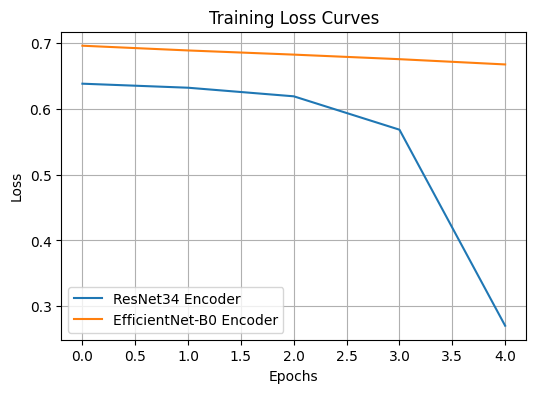

In [6]:
# ==============================================================
# 🚀 FINAL OFFLINE U-Net Encoder Comparison
# ResNet34 vs EfficientNet-B0 (Fully Working, 128x128 Output)
# ==============================================================

import torch, time, numpy as np, matplotlib.pyplot as plt
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import timm
from PIL import Image
from pycocotools.coco import COCO
import cv2, os, random
import torchvision.transforms as T

# --------------------------------------------------------------
# 1️⃣ SETUP
# --------------------------------------------------------------
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
DATA_ROOT = "/kaggle/input/coco-2017-dataset/coco2017"
IMG_DIR = f"{DATA_ROOT}/train2017"
ANN_FILE = f"{DATA_ROOT}/annotations/instances_train2017.json"
IMG_SIZE = (128, 128)
N_SAMPLES = 5
EPOCHS = 5
LR = 1e-3

# --------------------------------------------------------------
# 2️⃣ LOAD DATASET
# --------------------------------------------------------------
print("Loading COCO dataset...")
coco = COCO(ANN_FILE)
img_ids = random.sample(coco.getImgIds(), N_SAMPLES)
transform = T.Compose([T.Resize(IMG_SIZE), T.ToTensor()])

def load_img_and_mask(img_id):
    info = coco.loadImgs(img_id)[0]
    img = Image.open(f"{IMG_DIR}/{info['file_name']}").convert("RGB")
    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)
    mask = np.zeros((info["height"], info["width"]), dtype=np.uint8)
    for ann in anns:
        mask = np.maximum(mask, coco.annToMask(ann))
    img_t = transform(img)
    mask_t = torch.from_numpy(cv2.resize(mask, IMG_SIZE)).float().unsqueeze(0) / 255.0
    return img_t, mask_t

dataset = [load_img_and_mask(i) for i in img_ids]
imgs = torch.stack([i[0] for i in dataset])
masks = torch.stack([i[1] for i in dataset])
print(f"Loaded {len(imgs)} images.")

# --------------------------------------------------------------
# 3️⃣ U-NET MODEL
# --------------------------------------------------------------
class UNetCustom(nn.Module):
    def __init__(self, encoder, encoder_channels, out_channels=1):
        super().__init__()
        self.encoder = encoder

        self.up1 = nn.ConvTranspose2d(encoder_channels[-1], encoder_channels[-2], 2, 2)
        self.conv1 = self._conv_block(encoder_channels[-2]*2, encoder_channels[-2])

        self.up2 = nn.ConvTranspose2d(encoder_channels[-2], encoder_channels[-3], 2, 2)
        self.conv2 = self._conv_block(encoder_channels[-3]*2, encoder_channels[-3])

        self.up3 = nn.ConvTranspose2d(encoder_channels[-3], encoder_channels[-4], 2, 2)
        self.conv3 = self._conv_block(encoder_channels[-4]*2, encoder_channels[-4])

        self.up4 = nn.ConvTranspose2d(encoder_channels[-4], 64, 2, 2)
        self.conv4 = self._conv_block(64, 64)

        self.up5 = nn.ConvTranspose2d(64, 32, 2, 2)
        self.conv5 = self._conv_block(32, 32)

        self.final = nn.Conv2d(32, out_channels, 1)

    def _conv_block(self, in_ch, out_ch):
        return nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        feats = self.encoder(x)
        x1, x2, x3, x4 = feats
        u1 = self.up1(x4)
        u1 = torch.cat([u1, x3], dim=1)
        u1 = self.conv1(u1)

        u2 = self.up2(u1)
        u2 = torch.cat([u2, x2], dim=1)
        u2 = self.conv2(u2)

        u3 = self.up3(u2)
        u3 = torch.cat([u3, x1], dim=1)
        u3 = self.conv3(u3)

        u4 = self.up4(u3)
        u4 = self.conv4(u4)

        u5 = self.up5(u4)
        u5 = self.conv5(u5)

        return torch.sigmoid(self.final(u5))

# --------------------------------------------------------------
# 4️⃣ ENCODERS (OFFLINE SAFE)
# --------------------------------------------------------------
print("Building ResNet34 encoder...")
class ResNetEncoder(nn.Module):
    def __init__(self):
        super().__init__()
        r = models.resnet34(weights=None)
        self.stage1 = nn.Sequential(r.conv1, r.bn1, r.relu, r.maxpool)
        self.stage2 = r.layer1
        self.stage3 = r.layer2
        self.stage4 = r.layer3
        self.stage5 = r.layer4
    def forward(self, x):
        x1 = self.stage1(x)
        x2 = self.stage2(x1)
        x3 = self.stage3(x2)
        x4 = self.stage4(x3)
        x5 = self.stage5(x4)
        return [x2, x3, x4, x5]

model_r34 = UNetCustom(ResNetEncoder(), [64, 128, 256, 512]).to(DEVICE)

# ✅ EfficientNet-B0 (handle 5 feature maps)
print("Building EfficientNet-B0 encoder...")
base_eff = timm.create_model("efficientnet_b0", pretrained=False, features_only=True)
channels_eff = base_eff.feature_info.channels()[-4:]  # take last 4
class EfficientNetEncoder(nn.Module):
    def __init__(self, base):
        super().__init__()
        self.base = base
    def forward(self, x):
        feats = self.base(x)
        return feats[-4:]  # last 4 feature maps

model_eff = UNetCustom(EfficientNetEncoder(base_eff), channels_eff).to(DEVICE)

# --------------------------------------------------------------
# 5️⃣ TRAINING LOOP
# --------------------------------------------------------------
def train(model, name):
    opt = optim.Adam(model.parameters(), lr=LR)
    criterion = nn.BCELoss()
    model.train()
    start = time.time()
    losses = []
    for e in range(EPOCHS):
        opt.zero_grad()
        preds = model(imgs.to(DEVICE))
        preds = torch.nn.functional.interpolate(preds, size=(128,128), mode="bilinear", align_corners=False)
        loss = criterion(preds, masks.to(DEVICE))
        loss.backward(); opt.step()
        losses.append(loss.item())
        print(f"{name} Epoch {e+1}/{EPOCHS}: Loss={loss.item():.4f}")
    return losses, time.time()-start

print("Training ResNet34 encoder...")
loss_r34, t_r34 = train(model_r34, "ResNet34")

print("Training EfficientNet-B0 encoder...")
loss_eff, t_eff = train(model_eff, "EfficientNet-B0")

# --------------------------------------------------------------
# 6️⃣ COMPARISON + PLOTS
# --------------------------------------------------------------
p_r34 = sum(p.numel() for p in model_r34.parameters())
p_eff = sum(p.numel() for p in model_eff.parameters())

print("\n==================== COMPARISON ====================")
print(f"Model\t\tParams (M)\tTime (s)\tFinal Loss")
print(f"ResNet34\t{p_r34/1e6:.2f}\t\t{t_r34:.1f}\t\t{loss_r34[-1]:.4f}")
print(f"EffNet-B0\t{p_eff/1e6:.2f}\t\t{t_eff:.1f}\t\t{loss_eff[-1]:.4f}")

plt.figure(figsize=(6,4))
plt.plot(loss_r34, label='ResNet34 Encoder')
plt.plot(loss_eff, label='EfficientNet-B0 Encoder')
plt.title("Training Loss Curves")
plt.xlabel("Epochs"); plt.ylabel("Loss")
plt.legend(); plt.grid(True)
plt.show()
